$$
    \newcommand{\genericdel}[3]{%
      \left#1#3\right#2
    }
    \newcommand{\del}[1]{\genericdel(){#1}}
    \newcommand{\sbr}[1]{\genericdel[]{#1}}
    \newcommand{\cbr}[1]{\genericdel\{\}{#1}}
    \newcommand{\abs}[1]{\genericdel||{#1}}
    \DeclareMathOperator*{\argmin}{arg\,min}
    \DeclareMathOperator*{\argmax}{arg\,max}
    \DeclareMathOperator{\Pr}{\mathbb{p}}
    \DeclareMathOperator{\E}{\mathbb{E}}
    \DeclareMathOperator{\Ind}{\mathbb{I}}
    \DeclareMathOperator{\var}{var}
    \DeclareMathOperator{\cov}{cov}
    \newcommand{\bnaive}{\widehat{\beta}}
    \newcommand{\bbayes}{\widetilde{\beta}}
    \newcommand{\bboot}{\beta^{*}}
    \newcommand{\bdouble}{\beta^{**}}
    \newcommand{\bbootnv}{\hat{\beta}^*}
    \newcommand{\bbootby}{\widetilde{\beta}^*}
    \newcommand{\bcorrect}{\beta^{\checkmark}}
    \newcommand{\bbayescorrect}{\widetilde{\beta}^{\checkmark}}
    \newcommand{\ybar}{\bar{Y}}
    \newcommand{\ypred}{\widetilde{y}}
    \newcommand{\ybarpred}{\widetilde{\bar{Y}}}
    \DeclareMathOperator{\invchi}{\mathrm{Inv-\chi}^2}
    \newcommand{\thresh}{\ybar{}_0}
    \newcommand{\muo}{\mu_{0}}
    \newcommand{\sigo}{\sigma_{0}}
    \newcommand{\hmt}{\bar{Y_t}}
    \newcommand{\hst}{s_t^2}
    \newcommand{\hmc}{\bar{Y_c}}
    \newcommand{\hsc}{s_c^2}
    \newcommand{\mt}{\mu_t}
    \newcommand{\sigt}{\sigma_t}
    \newcommand{\vt}{\sigma_t^2}
    \newcommand{\mc}{\mu_c}
    \newcommand{\vc}{\sigma_c^2}
    \newcommand{\sigc}{\sigma_c}
    \DeclareMathOperator*{\argmin}{arg\,min}
    \DeclareMathOperator*{\argmax}{arg\,max}
    \newcommand{\effect}{\mathrm{eff}}
    \newcommand{\xtilde}{\widetilde{X}}
    \DeclareMathOperator{\normal}{\mathcal{N}}
    \DeclareMathOperator{\unif}{Uniform}
    \newcommand{\below}{\unicode{x25E7}}
    \newcommand{\above}{\unicode{x25E8}}
    \newcommand{\discont}{\unicode{x25EB}}
    \newcommand{\jbelow}{\unicode{x21E5}}
    \newcommand{\jabove}{\unicode{x21E4}}
    \newcommand{\Xmax}{X_{\max}}
    \newcommand{\Xmin}{X_{\min}}
    \newcommand{\indep}{\perp}
$$

In [1]:
# executing this cell will install all required julia packages
import Pkg
Pkg.activate(".")
Pkg.instantiate()

 Activating environment at `~/Documents/Harvard/Natesh/TemperatureImputations/notebooks/Project.toml`


In [2]:
using StanSample, MCMCChains
using KernelDensity

In [3]:
using Plots, LaTeXStrings, StatsPlots
pyplot()
Plots.PyPlotBackend()

Plots.PyPlotBackend()

In [4]:
import PyPlot; plt=PyPlot
using LaTeXStrings
plt.rc("figure", dpi=300.0)
plt.rc("figure", figsize=(12,8))
plt.rc("savefig", dpi=300.0)
plt.rc("text", usetex=true)
plt.rc("font", family="serif")
plt.rc("font", serif="Palatino")
;
_pwd = pwd()

"/Users/imolk/Documents/Harvard/Natesh/TemperatureImputations/notebooks"

In [5]:
using Distributions

# Setup

In this experiment, we try to get closer to the application by giving each observation a different mean and standard deviation.

\begin{equation}
\begin{split}
X_i &\sim \normal \del{\mu_i, \sigma_i} \\
X_i & \indep X_j \forall i \neq j \\
\Xmax &= \max_i\cbr{X_i} \\
\Xmin &= \min_i\cbr{X_i}
\end{split}
\end{equation}

Let
\begin{equation}
\begin{split}
    \mu_i &= 10 + \sin\del{2\pi i / 50} \\
    \sigma_i &= \cos^2\del{2\pi i / 50} \\
    i &= 1, 2, \ldots, 100
\end{split}
\end{equation}

In [6]:
n = 100
i = collect(1:n)
μ_i = sin.(2π*i/50) .+ 10.0
σ_i = cos.(2π*i/50).^2
;

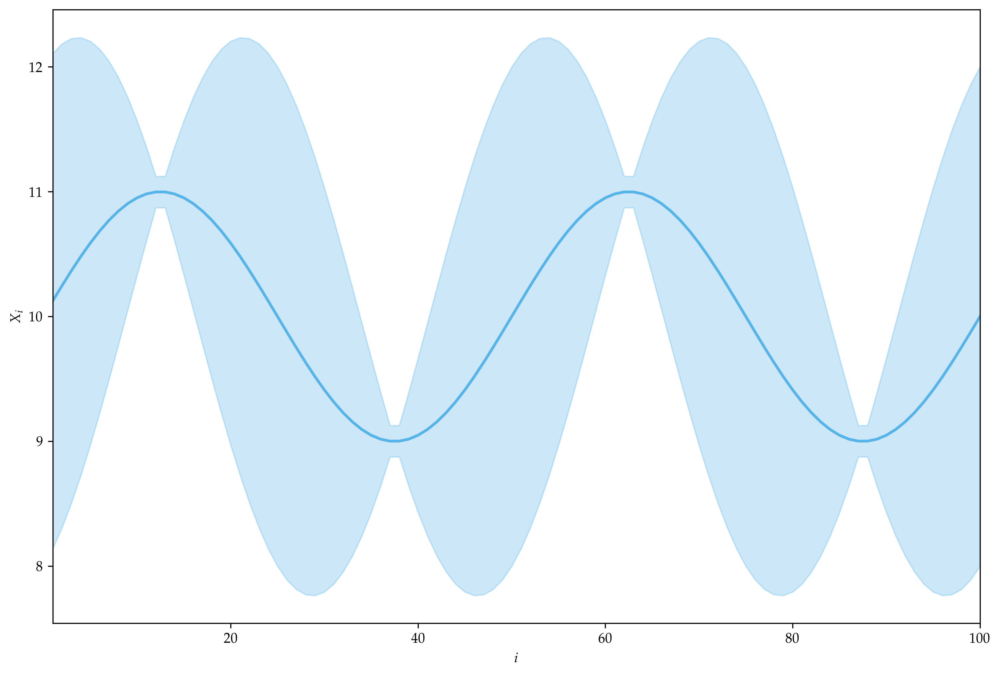

In [7]:
function plot_prior()
    cbbPalette = ["#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
    plt.fill_between(x=1:n, 
                     y1=μ_i .- 2 .* sqrt.(σ_i), 
                     y2=μ_i .+ 2 .* sqrt.(σ_i), 
                     color=cbbPalette[2], alpha=0.3)
    plt.plot(1:n, μ_i, color=cbbPalette[2], linewidth=2)
    plt.xlim(1,n)
    plt.xlabel(L"i")
    plt.ylabel(L"X_i")
    return
end
plot_prior()

In [8]:
Xi_rv  = [Normal(μ,σ) for (μ,σ) in zip(μ_i, σ_i)]
# xi_obs = [rand(X) for X in Xi_rv]
# Xmax = maximum(xi_obs)
# Xmin = minimum(xi_obs)
Xmax =  2.5 + 10
Xmin = -1.2 + 10

8.8

# Analytical Posterior

In [9]:
@time begin
    lfmin = [logpdf(X, Xmin) for X in Xi_rv]
    lfMax = [logpdf(X, Xmax) for X in Xi_rv]
    lFmin = [logcdf(X, Xmin) for X in Xi_rv]
    lFMax = [logcdf(X, Xmax) for X in Xi_rv]
    lFbetween = log.(expm1.(lFMax) .- expm1.(lFmin))

    logPij = Array{Float64}(undef, n,n)
    for j in 1:n
        for i in 1:n
            if i==j
                logPij[i,j] = -Inf
                continue
            end

            lpij = lfmin[i] + lfMax[j]
            for k in 1:n
                if i==k
                    continue
                elseif j==k
                    continue
                end
                lpij += lFbetween[k]
            end
            logPij[i,j] = lpij
        end
    end
    logPij
    Z = sum(exp.(logPij))
    Z = sum(expm1.(logPij))+n^2
    Pij = exp.(logPij .- log(Z))
    @assert sum(Pij) ≈ 1
end

  2.001858 seconds (4.40 M allocations: 133.385 MiB, 2.42% gc time)


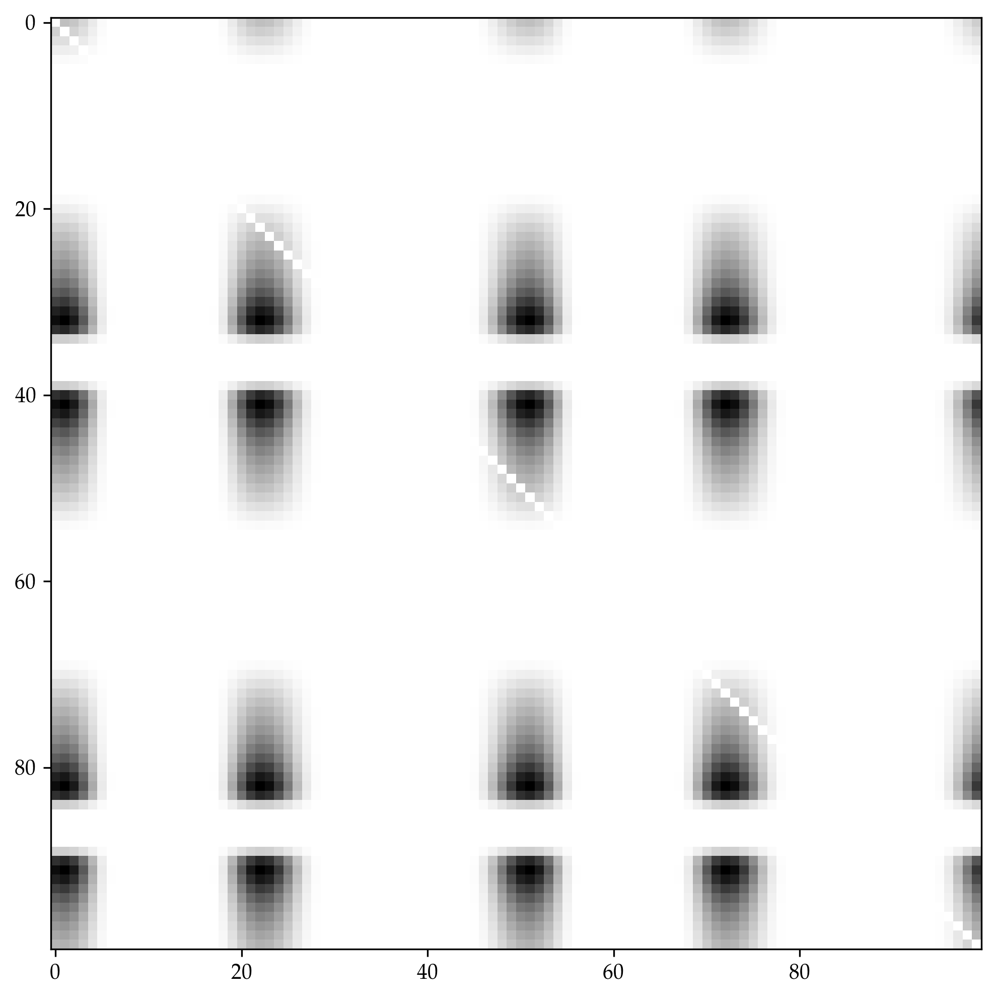

PyObject <matplotlib.image.AxesImage object at 0x1591bec70>

In [10]:
plt.imshow(Pij, interpolation="nearest", vmin=0, cmap="gray_r")

In [11]:
P_j = vec(sum(Pij; dims=1))
Pi_ = vec(sum(Pij; dims=2))
;
# Pi_[i] is the probability that 
# the ith unit set the minimum

In [12]:
plt.plot(1:n, Pi_.*100, "-", marker=".", label=L"$\Pr(\mathrm{argmin}(X)=i)$")
plt.plot(1:n, P_j.*100, "-", marker=".", label=L"$\Pr(\mathrm{argmax}(X)=i)$")
cbbPalette = ["#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
plt.fill_between(x=1:n, 
                 y1=μ_i .+mean_m .- sqrt.(σ_i), 
                 y2=μ_i .+mean_m .+ sqrt.(σ_i), 
                 label=L"\Pr(X_i)",
                 color=cbbPalette[2], alpha=0.3)
plt.plot(1:n, μ_i, color=cbbPalette[2])
plt.xlabel("i")
plt.legend(loc="best")

LoadError: UndefVarError: mean_m not defined

In [13]:
@time begin
n_xx = 10000
xx_cdf = range(Xmin, Xmax; length=n_xx)
Xiconditional_cdf = Vector{Vector{Float64}}(undef, n)
for i in 1:n
    Xiconditional_cdf[i] = (Pi_[i] 
        .+ (1-Pi_[i]-P_j[i])
           .* (cdf.(Xi_rv[i],xx_cdf)
               .- cdf.(Xi_rv[i],Xmin)
               ) 
           ./ exp(lFbetween[i])
        )
end
end

  0.476848 seconds (668.83 k allocations: 42.746 MiB, 4.75% gc time)


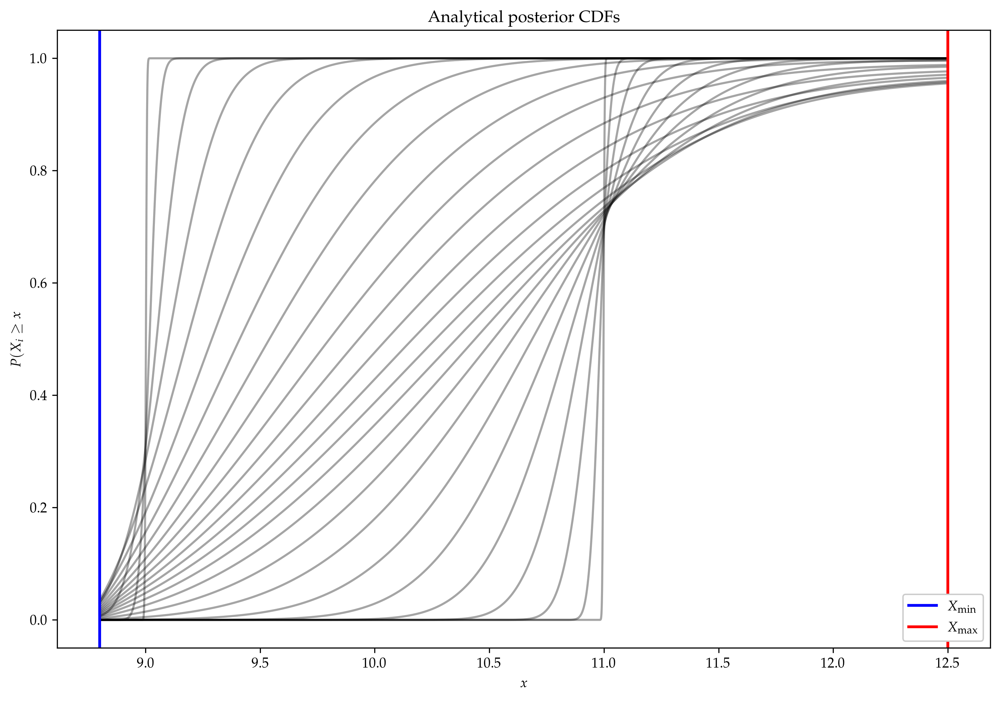

In [14]:
for i in 1:n
    plt.plot(xx_cdf, Xiconditional_cdf[i], color="black", alpha=0.1)
end
plt.axvline(x=Xmin, color="blue", label=L"$X_{\min}$", linewidth=2)
plt.axvline(x=Xmax, color="red", label=L"$X_{\max}$", linewidth=2)
plt.legend(loc="lower right", 
           framealpha=1.0)
plt.ylabel(L"$P(X_i \ge x$")
plt.xlabel(L"$x$")
plt.title("Analytical posterior CDFs")
;

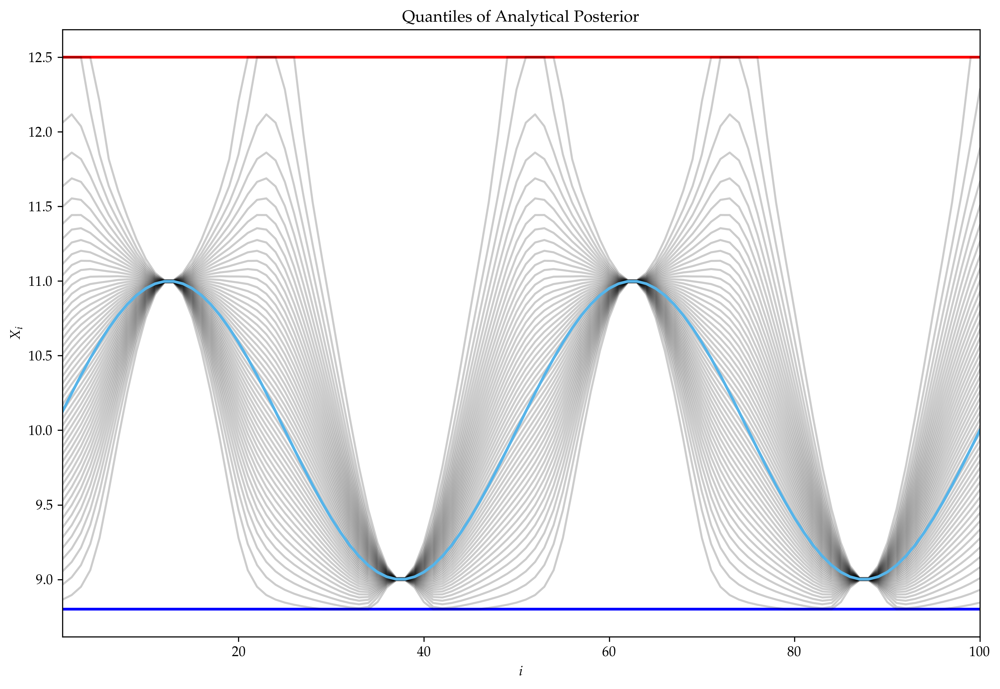

In [15]:
function plot_analy()
    plt.axhline(y=Xmin, color="blue", label=L"$X_{\min}$", linewidth=2)
    plt.axhline(y=Xmax, color="red", label=L"$X_{\max}$", linewidth=2)
    for quant in (0:0.02:1)[2:end-1]
        iquant = [searchsortedfirst(Xiconditional_cdf[i], quant)
                      for i in 1:n]
        analytic_q = xx_cdf[min.(iquant, n_xx)]
        plt.plot(1:n, analytic_q, color="black", alpha=0.2)
    end
    plt.plot(1:n, μ_i, color=cbbPalette[2], linewidth=2)
    plt.ylabel(L"X_i")
    plt.xlabel(L"i")
    plt.xlim(1,n)
    plt.title("Quantiles of Analytical Posterior")
    return
end
plot_analy()

# Stan no-smooth

In [16]:
model_nosmooth = """
    data {
        int<lower=0> N; // number of observations
        real Xmax;
        real Xmin;
        vector[N] mu_i;
        real<lower=0> sigma_i[N];
    }
    parameters {
        vector[N] X_i; // latent variables
    }
    model {
        X_i ~ normal(mu_i, sigma_i);
        Xmax ~ normal(max(X_i), 0.01);
        Xmin ~ normal(min(X_i), 0.01);
    }
"""

data = Dict(
    "N" => n,
    "Xmax" => Xmax,
    "Xmin" => Xmin,
    "mu_i" => μ_i,
    "sigma_i" => σ_i,
    "k" => 30,
    )

Dict{String,Any} with 6 entries:
  "sigma_i" => [0.984292, 0.938153, 0.864484, 0.767913, 0.654508, 0.531395, 0.4…
  "mu_i"    => [10.1253, 10.2487, 10.3681, 10.4818, 10.5878, 10.6845, 10.7705, …
  "N"       => 100
  "k"       => 30
  "Xmin"    => 8.8
  "Xmax"    => 12.5

In [17]:
# Default for tmpdir is to create a new tmpdir location
# To prevent recompilation of a Stan progam, choose a fixed location,
tmpdir=abspath("./stan_tmpdir")
@time stan_nosmooth = SampleModel(
    "nosmooth",
    model_nosmooth,
    [4];
    seed=StanBase.RandomSeed(123),
    method=StanSample.Sample(
        save_warmup=false,
        num_warmup=1000,
        num_samples=10_000,
        thin=1),
    tmpdir=tmpdir);

  1.691634 seconds (995.17 k allocations: 46.983 MiB)


In [18]:
@time rc = stan_sample(stan_nosmooth, data=data, summary=true)
;

 66.228943 seconds (4.95 M allocations: 246.435 MiB, 0.18% gc time)


In [19]:
@assert success(rc)
(read_samples(stan_nosmooth; output_format=:mcmcchains)
    |> x -> summarystats(x[:,1:10,:])
    |> display
)

Summary Statistics
  parameters      mean       std   naive_se      mcse       ess      rhat 
      Symbol   Float64   Float64    Float64   Float64   Float64   Float64 

       X_i.1    0.6109    0.4960     0.0025    0.0248   80.1797   15.7567
       X_i.2    0.5064    0.4883     0.0024    0.0244   80.6690    3.7467
       X_i.3    0.3132    0.5145     0.0026    0.0257   81.2672    2.7071
       X_i.4    0.9543    0.6204     0.0031    0.0311   80.3786    6.1854
       X_i.5    0.4286    0.5241     0.0026    0.0262   81.1491    2.7386
       X_i.6    0.7231    0.5462     0.0027    0.0273   80.3770    5.8702
       X_i.7    1.1088    1.1781     0.0059    0.0590   80.9195    2.8707
       X_i.8    0.9740    0.4741     0.0024    0.0237   80.1622   72.5544
       X_i.9    2.4318    3.9925     0.0200    0.1999   80.5830    4.2081
      X_i.10    2.9257    2.7052     0.0135    0.1354   80.7726    3.2312


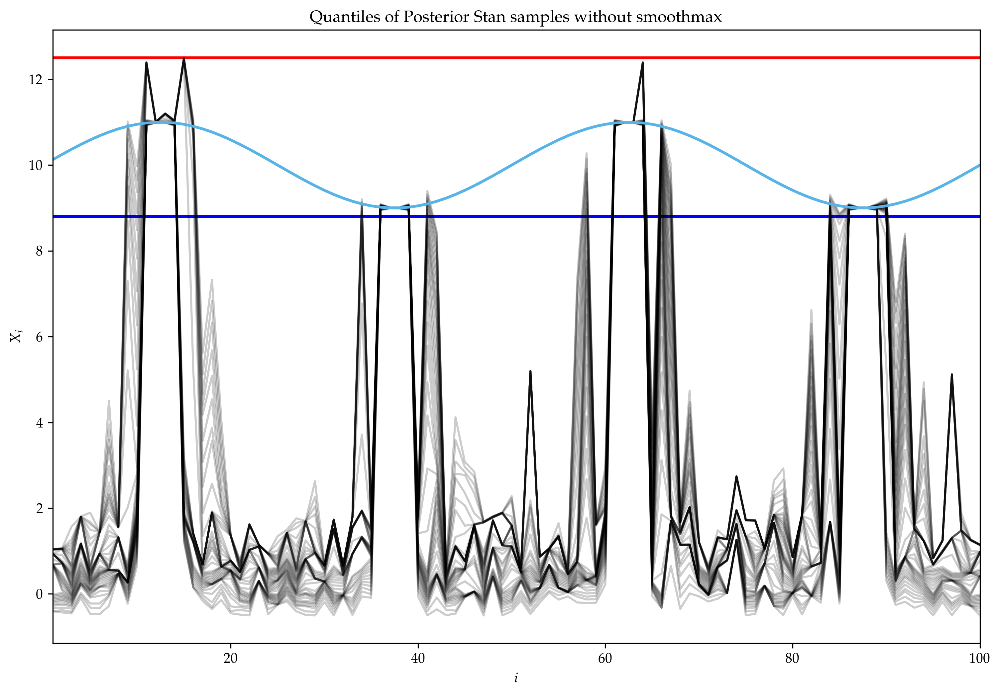

In [20]:
function plot_stan(chains)
    plt.axhline(y=Xmin, color="blue", label=L"$X_{\min}$", linewidth=2)
    plt.axhline(y=Xmax, color="red", label=L"$X_{\max}$", linewidth=2)
    variablenames = [Symbol("X_i.$i") for i in 1:n]
    for quant in (0:0.02:1)[2:end-1]
        yquant = [quantile(vec(chains.value[:, var, :]), quant) for var in variablenames]
        plt.plot(1:n, yquant, color="black", alpha=0.2)
    end
    
    plt.plot(1:n, μ_i, color=cbbPalette[2], linewidth=2)
    plt.ylabel(L"X_i")
    plt.xlabel(L"i")
    plt.xlim(1,n)
    plt.title("Quantiles of Posterior Stan samples")
    return
end
read_samples(stan_nosmooth; output_format=:mcmcchains) |> plot_stan
plt.title("Quantiles of Posterior Stan samples without smoothmax")
;

# Stan with smoothmax

In [21]:
model_smoothmax = """
    functions {
        real smoothmax(vector x, real k, real maxkx){
            return (maxkx+log(sum(exp(k*x - maxkx))))/k;
        }
        real smoothmin(vector x, real k, real minkx){
            return -smoothmax(-x, k, -minkx);
        }
    }
    data {
        int<lower=0> N; // number of observations
        real Xmax;
        real Xmin;
        vector[N] mu_i;
        real<lower=0> sigma_i[N];
        real<lower=0> k;
    }
    parameters {
        vector[N] X_i; // latent variables
    }
    transformed parameters {
        real Xsmoothmax;
        real Xsmoothmin;
        Xsmoothmax = smoothmax(X_i, k, k*Xmax);
        Xsmoothmin = smoothmin(X_i, k, k*Xmin);
    }
    model {
        X_i ~ normal(mu_i, sigma_i);
        Xmax ~ normal(Xsmoothmax, 0.01);
        Xmin ~ normal(Xsmoothmin, 0.01);
    }
"""
;

In [22]:
# Default for tmpdir is to create a new tmpdir location
# To prevent recompilation of a Stan progam, choose a fixed location,
tmpdir=abspath("./stan_tmpdir")
@time stan_smoothmax = SampleModel(
    "smoothmax",
    model_smoothmax,
    [4];
    seed=StanBase.RandomSeed(123),
    method=StanSample.Sample(
        save_warmup=false,
        num_warmup=1000,
        num_samples=10_000,
        thin=1),
    tmpdir=tmpdir);
@time rc = stan_sample(stan_smoothmax, data=data, summary=true)
@assert success(rc)
(read_samples(stan_smoothmax; output_format=:mcmcchains)
    |> x -> summarystats(x[:,1:10,:])
    |> display
)

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in '/Users/imolk/Documents/Harvard/Natesh/TemperatureImputations/notebooks/stan_tmpdir/smoothmax.stan', line 28, column 8 to column 40)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in '/Users/imolk/Documents/Harvard/Natesh/TemperatureImputations/notebooks/stan_tmpdir/smoothmax.stan', line 28, column 8 to column 40)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sam

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in '/Users/imolk/Documents/Harvard/Natesh/TemperatureImputations/notebooks/stan_tmpdir/smoothmax.stan', line 28, column 8 to column 40)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:

but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.Exception: normal_lpdf: Location parameter is inf, but must be finite! (in '/Users/imolk/Documents/Harvard/Natesh/TemperatureImputations/notebooks/stan_tmpdir/smoothmax.stan', line 28, column 8 to column 40)


If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sam

  1.117885 seconds (816 allocations: 135.016 KiB)


Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in '/Users/imolk/Documents/Harvard/Natesh/TemperatureImputations/notebooks/stan_tmpdir/smoothmax.stan', line 28, column 8 to column 40)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sampler is fine,
but if this warning occurs often then your model may be either severely ill-conditioned or misspecified.

Informational Message: The current Metropolis proposal is about to be rejected because of the following issue:
Exception: normal_lpdf: Location parameter is inf, but must be finite! (in '/Users/imolk/Documents/Harvard/Natesh/TemperatureImputations/notebooks/stan_tmpdir/smoothmax.stan', line 28, column 8 to column 40)
If this warning occurs sporadically, such as for highly constrained variable types like covariance matrices, then the sam

Summary Statistics
  parameters      mean       std   naive_se      mcse          ess      rhat 
      Symbol   Float64   Float64    Float64   Float64      Float64   Float64 

       X_i.1   10.3682    0.9082     0.0045    0.0062   18914.1311    1.0001
       X_i.2   10.4418    0.9066     0.0045    0.0065   18860.9296    1.0000
       X_i.3   10.5025    0.8670     0.0043    0.0062   19239.0433    1.0000
       X_i.4   10.5605    0.7894     0.0039    0.0052   22672.8942    1.0000
       X_i.5   10.6231    0.6823     0.0034    0.0043   24835.1257    1.0000
       X_i.6   10.6875    0.5394     0.0027    0.0026   42438.0457    0.9999
       X_i.7   10.7730    0.4077     0.0020    0.0018   49548.8266    1.0000
       X_i.8   10.8459    0.2872     0.0014    0.0012   52021.7677    1.0000
       X_i.9   10.9041    0.1812     0.0009    0.0009   46073.9035    1.0000
      X_i.10   10.9508    0.0961     0.0005    0.0004   53405.9106    1.0000


 76.047755 seconds (10.98 k allocations: 900.844 KiB)


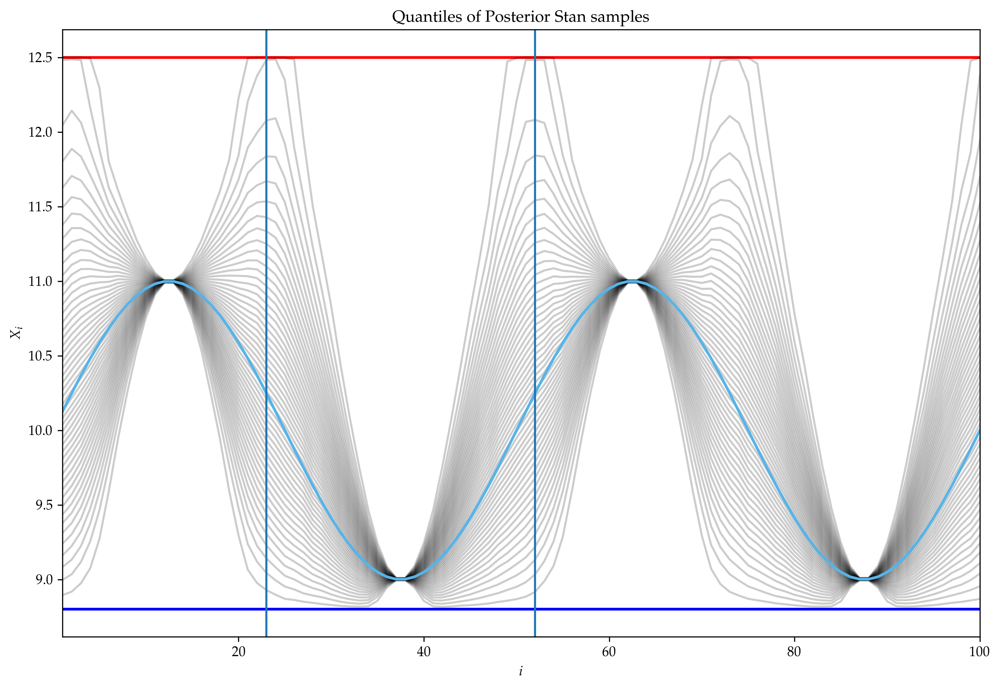

PyObject <matplotlib.lines.Line2D object at 0x16b6b12e0>

In [23]:
read_samples(stan_smoothmax; output_format=:mcmcchains) |> plot_stan
plt.axvline(23)
plt.axvline(52)

# Joint Posterior

## Scatter

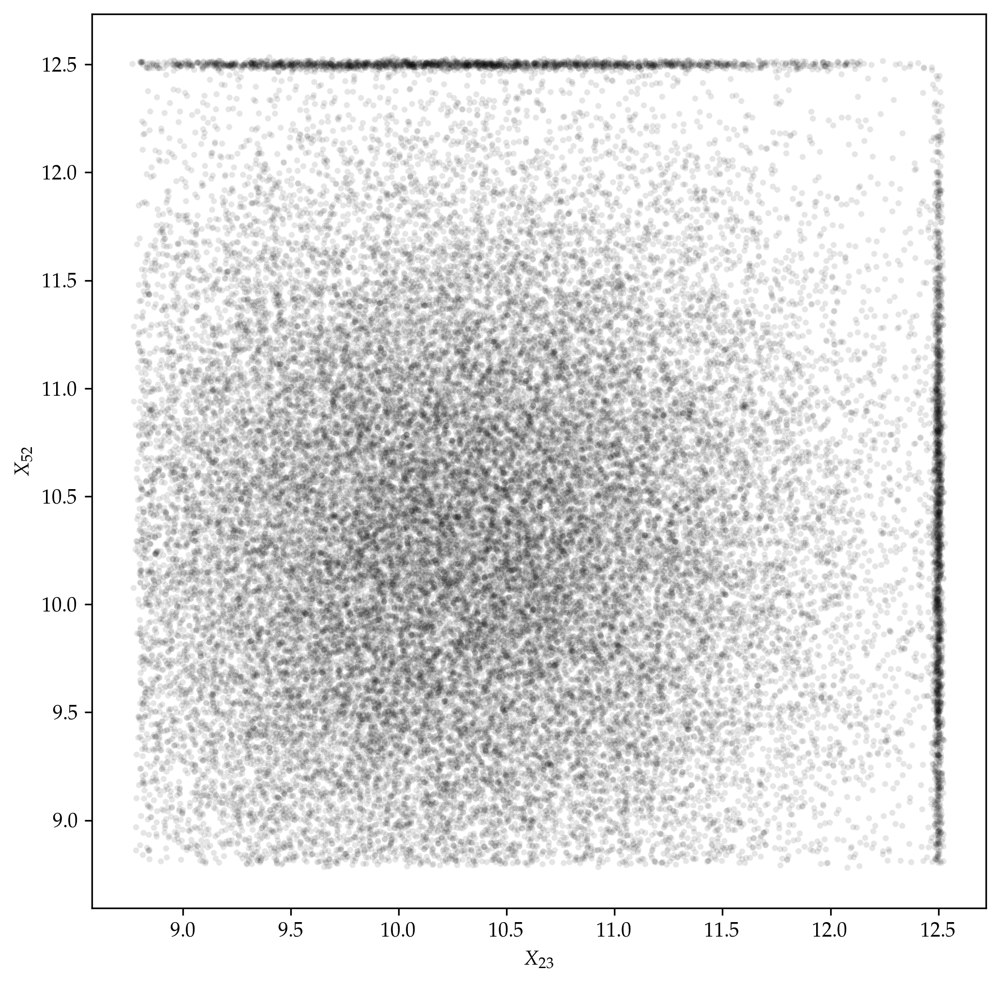

In [24]:
function plot_scatter(chains)
    i = 23
    j = 52
    plt.scatter(chains[:,i,:], chains[:,j,:], 
                marker=".", edgecolors="none", color="black", alpha=0.1)
    plt.xlabel(L"$X_{23}$")
    plt.ylabel(L"$X_{52}$")
    plt.axis("square")
end
read_samples(stan_smoothmax; output_format=:mcmcchains) |> plot_scatter;

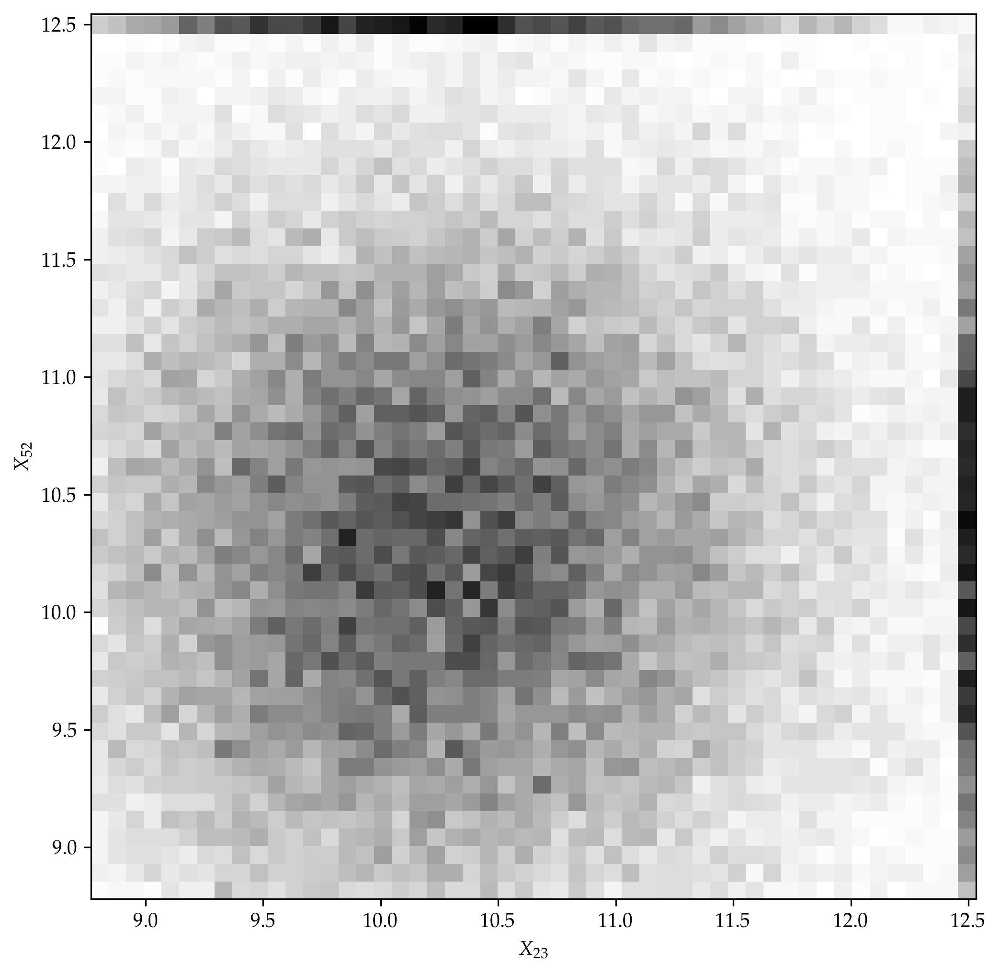

(8.76782, 12.5314, 8.78034, 12.54392)

In [25]:
let
    chains = read_samples(stan_smoothmax; output_format=:mcmcchains)
    i = 23
    j = 52
    plt.hist2D(vec(chains[:,i,:]), vec(chains[:,j,:]), bins=50, cmap="gray_r")
    plt.xlabel(L"$X_{23}$")
    plt.ylabel(L"$X_{52}$")
    plt.axis("square")
end

## X_stacked

In [26]:
chns = read_samples(stan_smoothmax; output_format=:mcmcchains)
X_stacked = hcat((vec(chns[:,i,:]) for i in 1:n)...)
;

## CDF

In [27]:
function fracbelow(X_stacked, xx_grid, i, j)
    n_grid = length(xx_grid)
    X_i_samples = X_stacked[:,i]
    X_j_samples = X_stacked[:,j]
    xy_sumbelow = zeros(Int, n_grid, n_grid)
    n_samples = size(X_stacked, 1)
    for jg in 1:n_grid
        for ig in 1:n_grid
            @inbounds for k in 1:n_samples
                xy_sumbelow[ig,jg] += (
                      (X_i_samples[k] <= xx_grid[ig])
                    & (X_j_samples[k] <= xx_grid[jg])
                    ) ? 1 : 0
            end
        end
    end
    return xy_sumbelow ./ n_samples
end

xx_grid = range(Xmin-0.1, Xmax+0.1; step=0.1)
@time xy_fracbelow = let

    @show size(X_stacked)
    fracbelow(X_stacked, xx_grid, 23, 52)
end
;

size(X_stacked) = (40000, 100)
  0.187573 seconds (312.01 k allocations: 16.289 MiB)


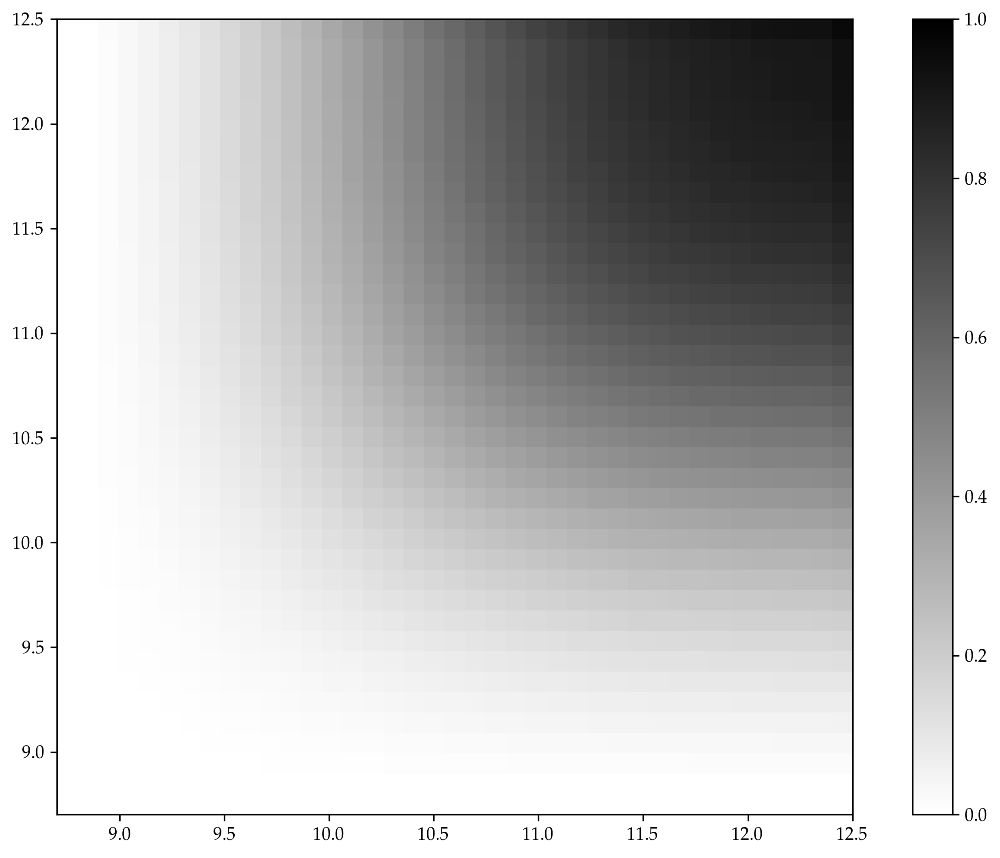

In [28]:
plt.imshow(
        xy_fracbelow', 
        interpolation="nearest", 
        cmap="gray_r", 
        vmin=0, vmax=1, 
        origin="lower",
        extent=(minimum(xx_grid), maximum(xx_grid), minimum(xx_grid), maximum(xx_grid)),
        )
plt.colorbar()
;

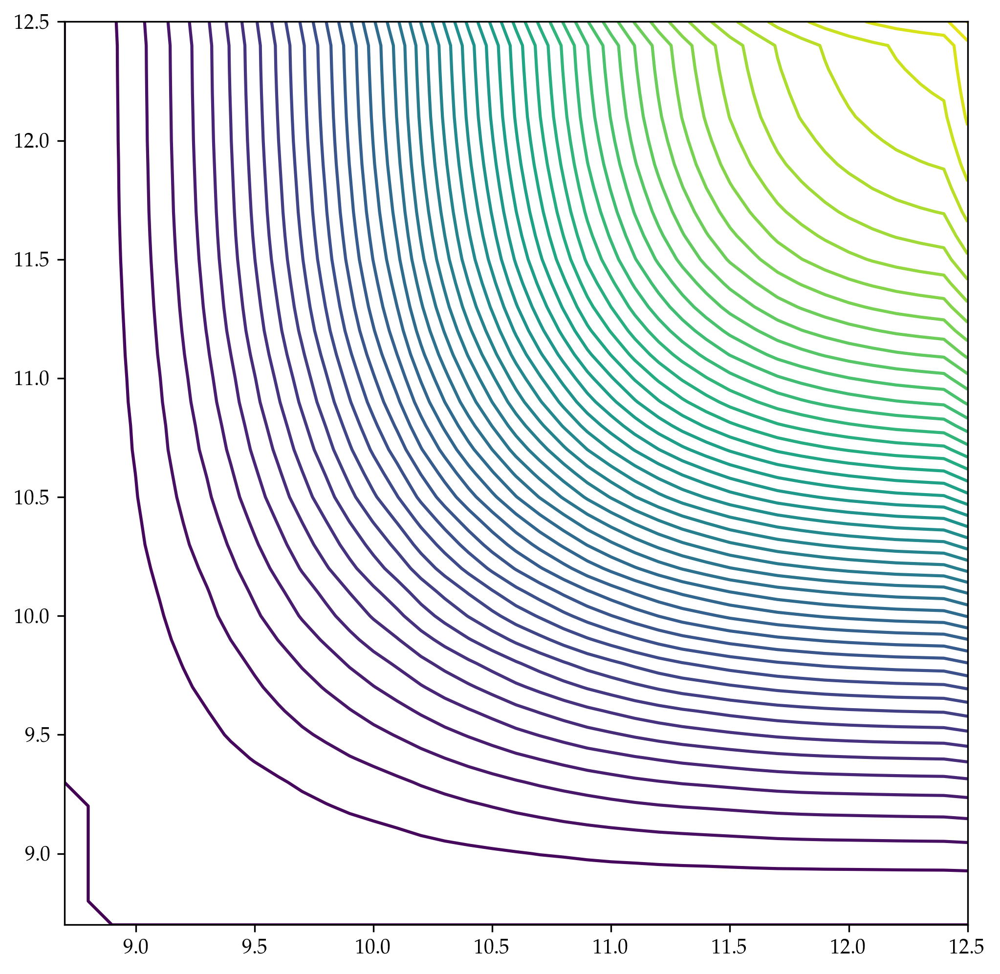

In [29]:
plt.contour(xx_grid, xx_grid, xy_fracbelow, levels=50)
plt.axis("square")
;

## Contour

In [30]:
function find_min_max(X_stacked)
    n_samples = size(X_stacked, 1)
    sample_min = [findmin(X_stacked[k,:])[2] for k in 1:n_samples]
    sample_max = [findmax(X_stacked[k,:])[2] for k in 1:n_samples]
    return sample_min, sample_max
end

function extract_middle(X_stacked, i, j)
    sample_min, sample_max = find_min_max(X_stacked)
    i_is_min = sample_min .== i
    j_is_min = sample_min .== j
    i_is_max = sample_max .== i
    j_is_max = sample_max .== j
    return X_stacked[(.!i_is_min) .& (.!j_is_min) .& (.!i_is_max) .& (.!j_is_max),
                     [i, j]]
end
println(size(X_stacked))
i = 23
j = 52
X_middle = extract_middle(X_stacked, i, j)
println(size(X_middle))
prop_middle = size(X_middle, 1) / size(X_stacked, 1)

(40000, 100)
(36130, 2)


0.90325

### KDE

In [31]:
bandwidth=0.2
kde_ij = kde((X_middle[:,1], X_middle[:,2]);
             kernel=(Normal, Normal),
             bandwidth=(bandwidth, bandwidth),
             )

bounded_density = copy(kde_ij.density)
margin=0
for (i,x) in enumerate(kde_ij.x)
    x_kern = Normal(x, bandwidth)
    p_within_x = cdf(x_kern, Xmax-margin) - cdf(x_kern,Xmin+margin)
    for (j,y) in enumerate(kde_ij.y)
        y_kern = Normal(y, bandwidth)
        p_within_y = cdf(y_kern, Xmax-margin) - cdf(y_kern,Xmin+margin)
        p_within = p_within_x * p_within_y
        bounded_density[i,j] /= p_within
    end
end
kde_ij.density = bounded_density
;

In [32]:
n_cntr = 256
xx_cntr = collect(range(Xmin, Xmax; length=n_cntr))
kde_pdf_grid = Array{Float64}(undef, n_cntr, n_cntr)
ik = InterpKDE(kde_ij)
for j in 1:n_cntr
    for i in 1:n_cntr
        kde_pdf_grid[i,j] = pdf(ik, xx_cntr[i], xx_cntr[j])
    end
end
kde_pdf_grid .*= prop_middle
;

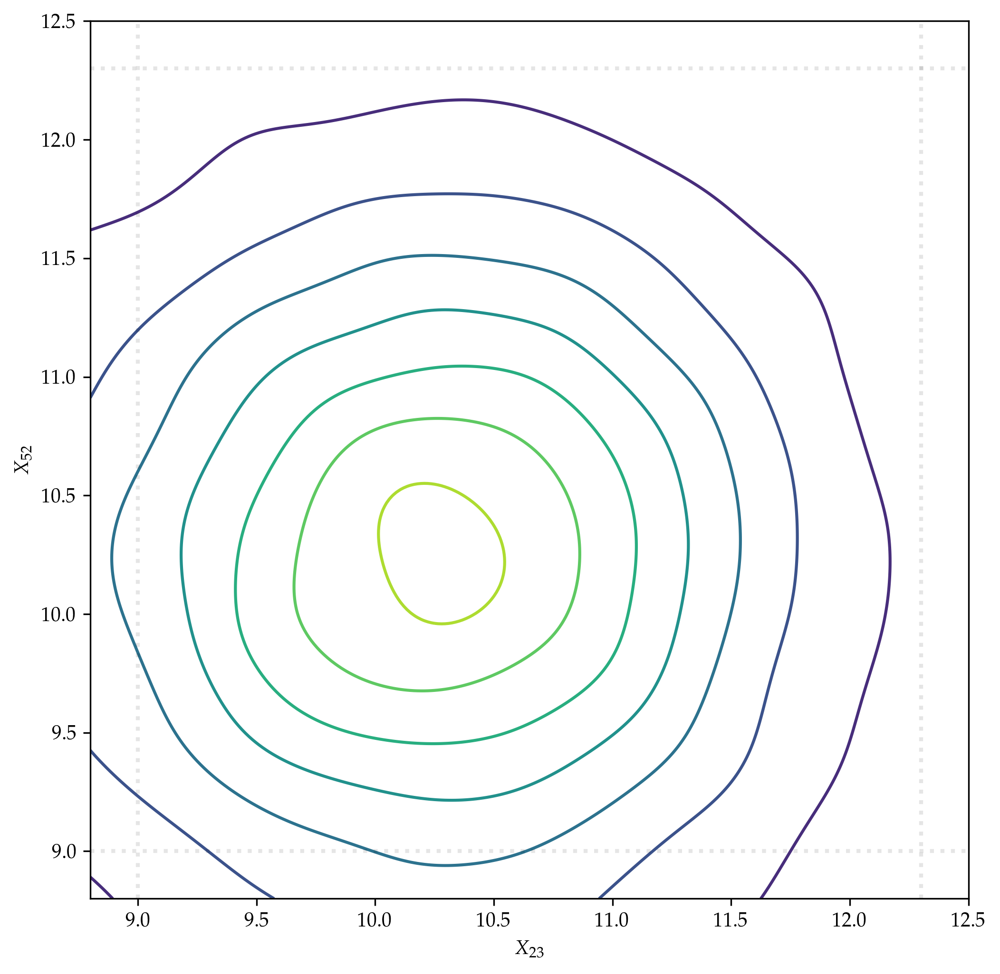

In [33]:
plt.contour(xx_cntr, xx_cntr, kde_pdf_grid)
plt.axis("square")
plt.xlabel(L"$X_{23}$")
plt.ylabel(L"$X_{52}$")
plt.axvline(Xmin+margin+bandwidth, color="black", 
            linestyle=":", linewidth=2, alpha=0.1)
plt.axhline(Xmin+margin+bandwidth, color="black", 
            linestyle=":", linewidth=2, alpha=0.1)
plt.axvline(Xmax-margin-bandwidth, color="black", 
            linestyle=":", linewidth=2, alpha=0.1)
plt.axhline(Xmax-margin-bandwidth, color="black", 
            linestyle=":", linewidth=2, alpha=0.1)
;

### Analytical

In [34]:
i = 23
j = 52
weight_middle = 1 - (Pi_[i] + Pi_[j] + P_j[i] + P_j[j]) + (Pij[i,j] + Pij[j,i])

0.8983507300193352

In [35]:
i = 23
j = 52
trunc_i = Distributions.TruncatedNormal(μ_i[i], σ_i[i], Xmin, Xmax)
trunc_j = Distributions.TruncatedNormal(μ_i[j], σ_i[j], Xmin, Xmax)

anal_pdf_grid = Array{Float64}(undef, n_cntr, n_cntr)
for j in 1:n_cntr
    for i in 1:n_cntr
        anal_pdf_grid[i,j] = pdf(trunc_i, xx_cntr[i]) * pdf(trunc_j, xx_cntr[j])
    end
end
anal_pdf_grid .*= weight_middle
;

### Overplot

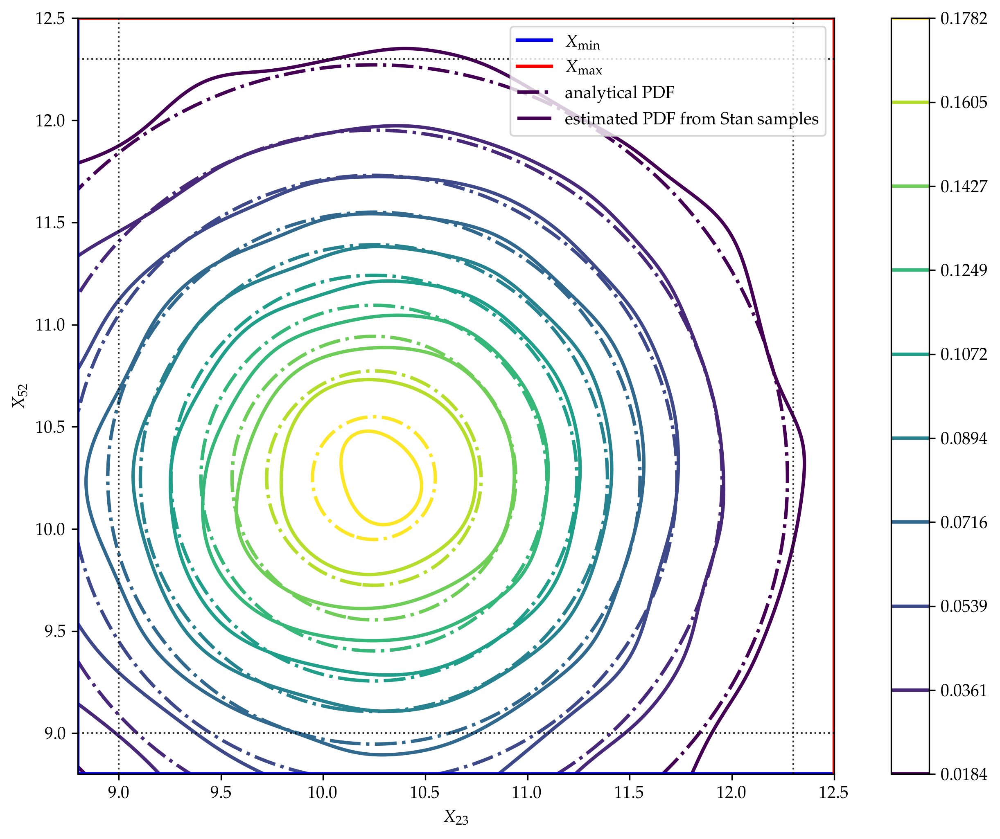

In [36]:
function plot_contours(;plot_minmax=true, plot_kdelim=true)
    pdf_min = min(minimum(anal_pdf_grid), minimum(kde_pdf_grid))
    pdf_max = max(maximum(anal_pdf_grid), maximum(kde_pdf_grid))
    pdf_V = range(pdf_min, 0.95*pdf_max; length=11)[2:end]
    cbbPalette = ["#E69F00", "#56B4E9", "#009E73", "#F0E442", "#0072B2", "#D55E00", "#CC79A7"]
    ct = plt.contour(xx_cntr, xx_cntr, anal_pdf_grid, pdf_V,
                cmap="viridis",
                linewidths=2,
                linestyles="dashdot",
                )
    ct.collections[1].set_label("analytical PDF")
    ct = plt.contour(xx_cntr, xx_cntr, kde_pdf_grid, pdf_V, 
                cmap="viridis",
                linewidths=2,
                )
    ct.collections[1].set_label("estimated PDF from Stan samples")
    plt.axis("square")
    plt.xlabel(L"$X_{23}$")
    plt.ylabel(L"$X_{52}$")
    if plot_minmax
        plt.axhline(y=Xmin, color="blue", label=L"$X_{\min}$", linewidth=2)
        plt.axvline(x=Xmin, color="blue", linewidth=2)
        plt.axhline(y=Xmax, color="red", label=L"$X_{\max}$", linewidth=2)
        plt.axvline(x=Xmax, color="red", linewidth=2)
    end
    
    if plot_kdelim
        plt.axvline(Xmin+margin+bandwidth, color="black", 
                    linestyle=":", linewidth=1, alpha=0.8)
        plt.axhline(Xmin+margin+bandwidth, color="black", 
                    linestyle=":", linewidth=1, alpha=0.8)
        plt.axvline(Xmax-margin-bandwidth, color="black", 
                    linestyle=":", linewidth=1, alpha=0.8)
        plt.axhline(Xmax-margin-bandwidth, color="black", 
                    linestyle=":", linewidth=1, alpha=0.8)
    end
    return plt.gca()
end
plot_contours()
plt.legend(loc="upper right")
plt.colorbar()
;

## bottom margin

In [37]:
?plt.hist

Plot a histogram.

Compute and draw the histogram of *x*.  The return value is a tuple
(*n*, *bins*, *patches*) or ([*n0*, *n1*, ...], *bins*, [*patches0*,
*patches1*, ...]) if the input contains multiple data.  See the
documentation of the *weights* parameter to draw a histogram of
already-binned data.

Multiple data can be provided via *x* as a list of datasets
of potentially different length ([*x0*, *x1*, ...]), or as
a 2-D ndarray in which each column is a dataset.  Note that
the ndarray form is transposed relative to the list form.

Masked arrays are not supported.

The *bins*, *range*, *weights*, and *density* parameters behave as in
`numpy.histogram`.

Parameters
----------
x : (n,) array or sequence of (n,) arrays
    Input values, this takes either a single array or a sequence of
    arrays which are not required to be of the same length.

bins : int or sequence or str, default: :rc:`hist.bins`
    If *bins* is an integer, it defines the number of equal-width bins
    in the r

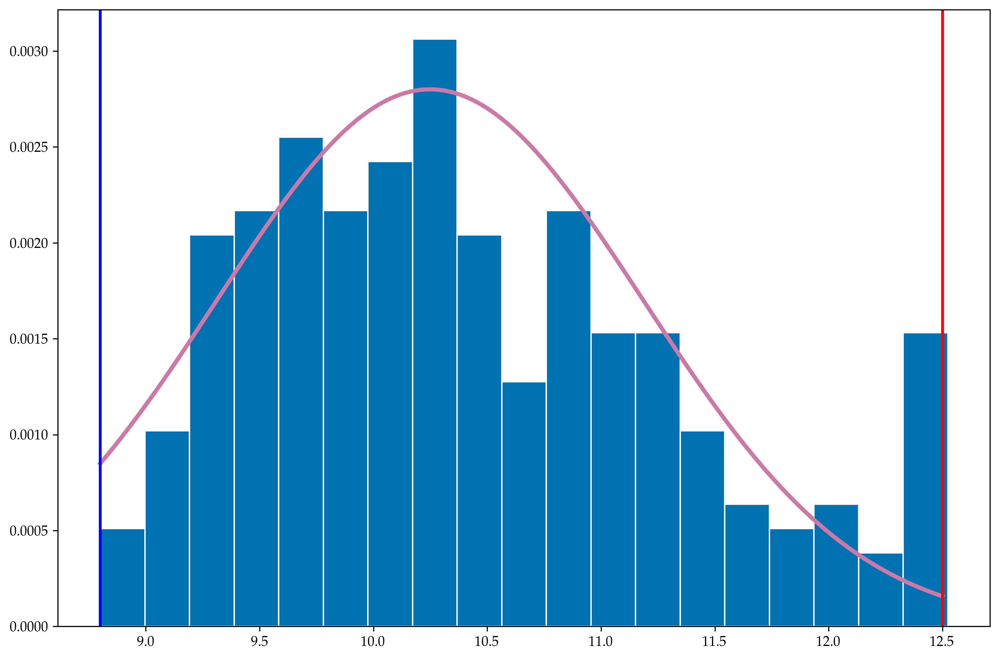

n_bottom_j = 229


In [38]:
function plot_bottom()
    i = 23
    j = 52
    sample_min, sample_max = find_min_max(X_stacked)
    bottom_j = sample_min .== j
    n_bottom_j = sum(bottom_j)
    @show n_bottom_j
    n_samples = size(X_stacked, 1)
    bins = range(min(Xmin,minimum(X_stacked[bottom_j,i])),
                 max(Xmax,maximum(X_stacked[bottom_j,i])); length=20)
    dx = median(diff(bins))
    plt.hist(X_stacked[bottom_j, i],
             weights=ones(n_bottom_j)./n_samples./dx,
             color=cbbPalette[5],
             edgecolor="white",
             bins=bins)
    anal_bottom_pdf = TruncatedNormal(μ_i[i], σ_i[i], Xmin, Xmax)
    n_hist = 1000
    xx = range(Xmin, Xmax; length=n_hist)
    plt.plot(xx, 
             (Pi_[j]-Pij[j,i]).*pdf.(anal_bottom_pdf, xx), 
             linewidth=3, 
             color=cbbPalette[7])
    plt.axvline(x=Xmin, color="blue", linewidth=2)
    plt.axvline(x=Xmax, color="red", linewidth=2)
end
plot_bottom()
;

## left margin

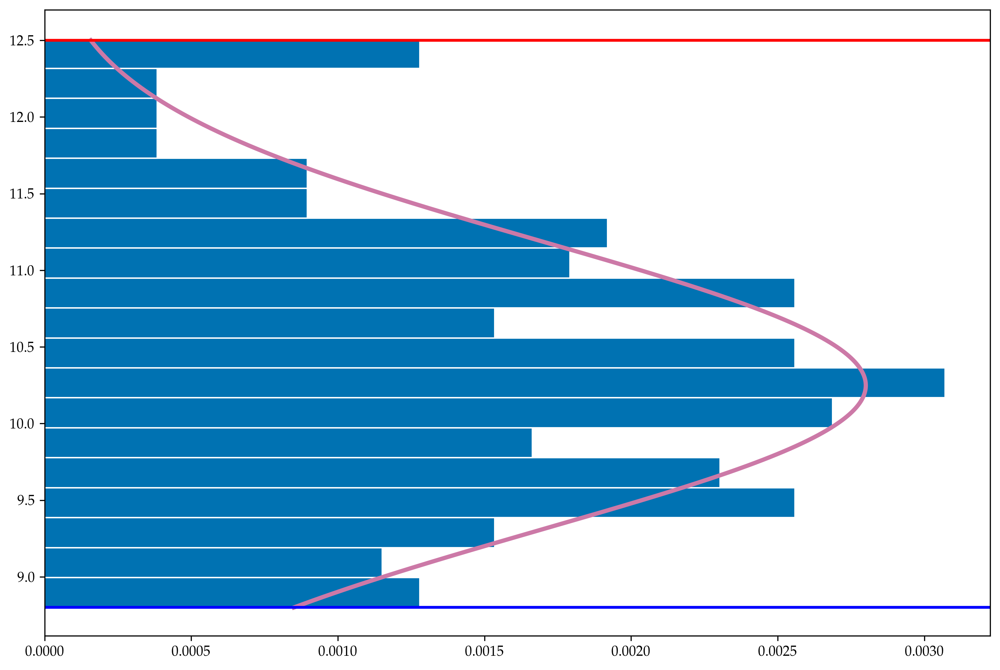

n_min_i = 241


PyObject <matplotlib.lines.Line2D object at 0x1583a2e80>

In [39]:
function plot_left(;orientation="vertical")
    i = 23
    j = 52
    sample_min, sample_max = find_min_max(X_stacked)
    i_is_min = sample_min .== i
    n_min_i = sum(i_is_min)
    @show n_min_i
    n_samples = size(X_stacked, 1)
    bins = range(min(Xmin,minimum(X_stacked[i_is_min,j])),
                 max(Xmax,maximum(X_stacked[i_is_min,j])); length=20)
    dx = median(diff(bins))
    plt.hist(X_stacked[i_is_min, j],
                   weights=ones(n_min_i)./n_samples./dx,
                   color=cbbPalette[5],
                   edgecolor="white",
                   orientation=orientation,
                   bins=bins)
    anal_left_pdf = TruncatedNormal(μ_i[j], σ_i[j], Xmin, Xmax)
    n_hist = 1000
    xx = range(Xmin, Xmax; length=n_hist)
    if orientation=="vertical"
        plt.plot(xx, 
                 (Pi_[i]-Pij[i,j]).*pdf.(anal_left_pdf, xx), 
                 linewidth=3, 
                 color=cbbPalette[7])
        plt.axvline(x=Xmin, color="blue", linewidth=2)
        plt.axvline(x=Xmax, color="red", linewidth=2)
    elseif orientation=="horizontal"
        plt.plot((Pi_[i]-Pij[i,j]).*pdf.(anal_left_pdf, xx), 
                 xx,
                 linewidth=3, 
                 color=cbbPalette[7])
        plt.axhline(y=Xmin, color="blue", linewidth=2)
        plt.axhline(y=Xmax, color="red", linewidth=2)
    end
end
plot_left(;orientation="horizontal")

## top margin

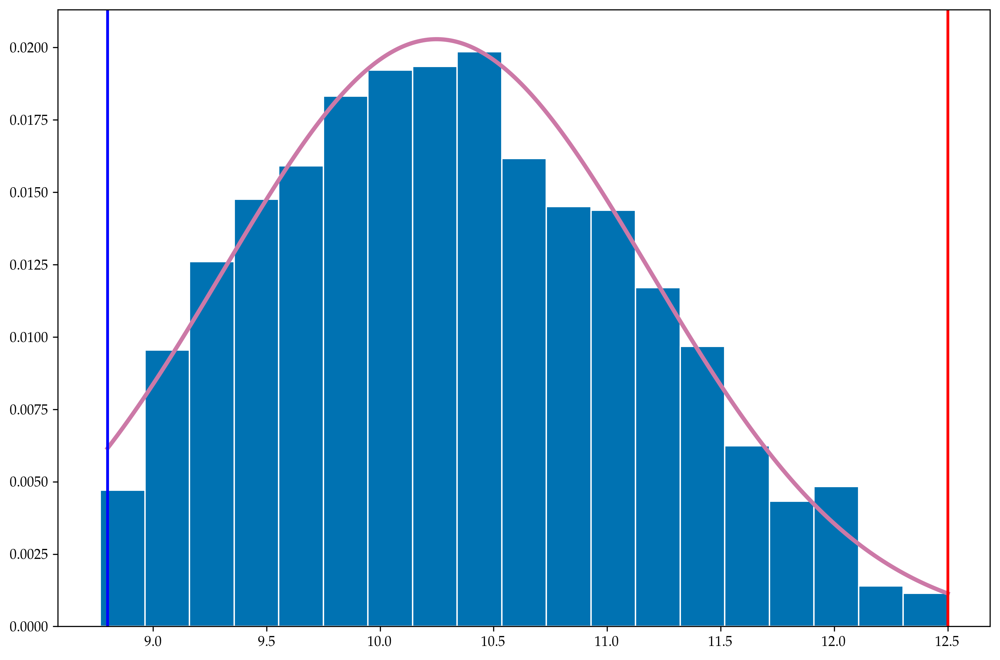

PyObject <matplotlib.lines.Line2D object at 0x16b9e0880>

In [40]:
function plot_top()
    i = 23
    j = 52
    sample_min, sample_max = find_min_max(X_stacked)
    j_is_max = sample_max .== j
    n_top = sum(j_is_max)
    n_samples = size(X_stacked, 1)
    bins = range(min(Xmin,minimum(X_stacked[j_is_max,i])),
                 max(Xmax,maximum(X_stacked[j_is_max,i])); length=20)
    dx = median(diff(bins))
    plt.hist(X_stacked[j_is_max, i],
                   weights=ones(n_top)./n_samples./dx,
                   color=cbbPalette[5],
                   edgecolor="white",
                   bins=bins)
    anal_top_pdf = TruncatedNormal(μ_i[i], σ_i[i], Xmin, Xmax)
    n_hist = 1000
    xx = range(Xmin, Xmax; length=n_hist)
    plt.plot(xx, 
             (P_j[j]-Pij[i,j]).*pdf.(anal_top_pdf, xx), 
             linewidth=3, 
             color=cbbPalette[7])
    plt.axvline(x=Xmin, color="blue", linewidth=2)
    plt.axvline(x=Xmax, color="red", linewidth=2)
end
plot_top()

## right margin

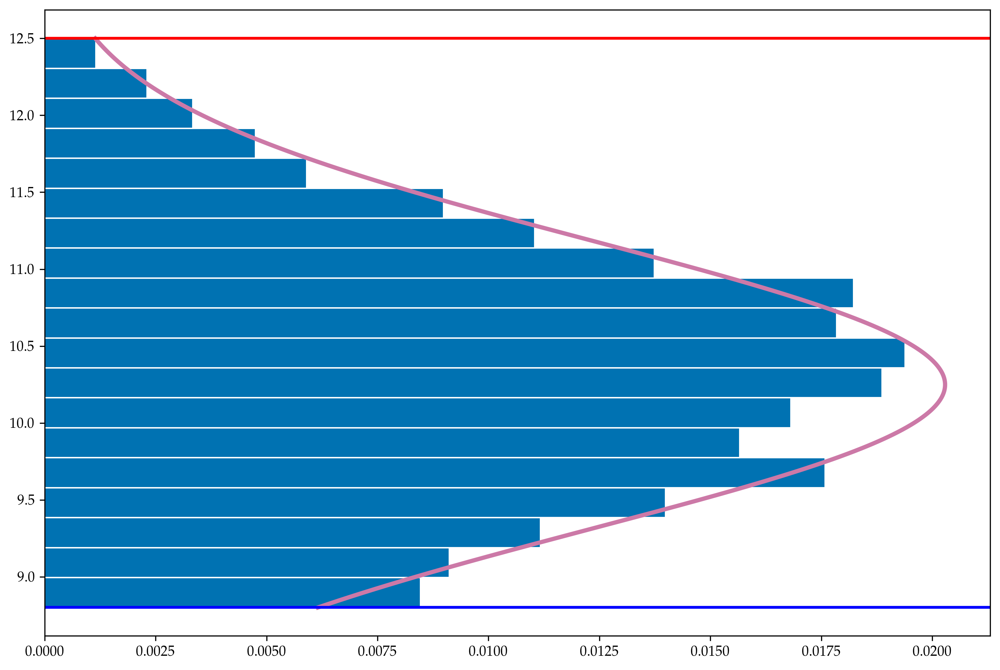

PyObject <matplotlib.lines.Line2D object at 0x167ec5190>

In [41]:
function plot_right(;orientation="vertical")
    i = 23
    j = 52
    sample_min, sample_max = find_min_max(X_stacked)
    i_is_max = sample_max .== i
    n_right = sum(i_is_max)
    n_samples = size(X_stacked, 1)
    bins = range(min(Xmin,minimum(X_stacked[i_is_max,j])),
                 max(Xmax,maximum(X_stacked[i_is_max,j])); length=20)
    dx = median(diff(bins))
    plt.hist(X_stacked[i_is_max, j],
                   weights=ones(n_right)./n_samples./dx,
                   color=cbbPalette[5],
                   edgecolor="white",
                   bins=bins,
                   orientation=orientation
                   )
    anal_right_pdf = TruncatedNormal(μ_i[j], σ_i[j], Xmin, Xmax)
    n_hist = 1000
    xx = range(Xmin, Xmax; length=n_hist)
    if orientation=="vertical"
        plt.plot(xx, 
                 (P_j[i]-Pij[j,i]).*pdf.(anal_right_pdf, xx), 
                 linewidth=3, 
                 color=cbbPalette[7])
        plt.axvline(x=Xmin, color="blue", linewidth=2)
        plt.axvline(x=Xmax, color="red", linewidth=2)
    elseif orientation=="horizontal"
        plt.plot((P_j[i]-Pij[j,i]).*pdf.(anal_right_pdf, xx), 
                 xx,
                 linewidth=3, 
                 color=cbbPalette[7])
        plt.axhline(y=Xmin, color="blue", linewidth=2)
        plt.axhline(y=Xmax, color="red", linewidth=2)
    end
end
plot_right(orientation="horizontal")

## All together

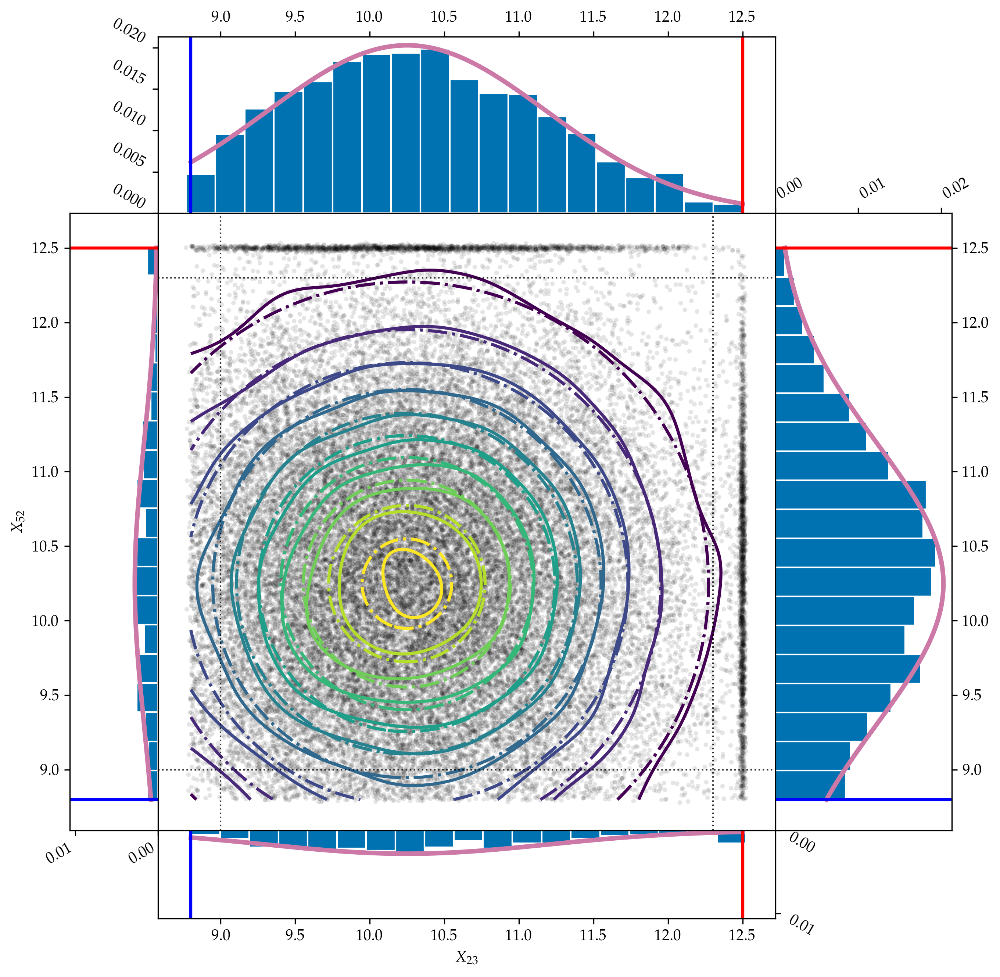

n_bottom_j = 229
n_min_i = 241


In [42]:
tr_width = 0.2
bl_width = 0.1
left, width = bl_width, 1 - tr_width-bl_width
bottom, height = bl_width, 1 - tr_width-bl_width

rect_scatter =   [left, bottom, width, height]
rect_hist_top =   [left, bottom+height, width, tr_width]
rect_hist_bottom = [left, 0.0, width, bl_width]
rect_hist_right = [left+width, bottom, tr_width, height]
rect_hist_left = [0.0, bottom, bl_width, height]

# start with a rectangular Figure
plt.figure(1, figsize=(8, 8))

axScatter = plt.axes(rect_scatter)
axHist_top = plt.axes(rect_hist_top)
axHist_bottom = plt.axes(rect_hist_bottom)
axHist_right = plt.axes(rect_hist_right)
axHist_left = plt.axes(rect_hist_left)

plt.sca(axScatter)
plot_contours(;plot_minmax=false)
plot_scatter(chns)
_xlim = plt.xlim()
_ylim = plt.ylim()

nullfmt = plt.matplotlib.ticker.NullFormatter()
axScatter.xaxis.set_major_formatter(nullfmt)
axScatter.yaxis.set_major_formatter(nullfmt)

plt.sca(axHist_top)
plot_top()
plt.xlim(_xlim)

plt.sca(axHist_right)
plot_right(;orientation="horizontal")
# base = plt.gca()[:transData]
# rot = plt.matplotlib[:transforms][:Affine2D]()[:rotate_deg](90.0)
plt.ylim(_ylim)

plt.sca(axHist_bottom)
plot_bottom()
plt.xlim(_xlim)


plt.sca(axHist_left)
plot_left(;orientation="horizontal")
plt.ylim(_ylim)

max_margin = 0.0
plt.sca(axHist_top)
max_margin = max(max_margin, plt.ylim()[2])
plt.sca(axHist_right)
max_margin = max(max_margin, plt.xlim()[2])
plt.sca(axHist_bottom)
max_margin = max(max_margin, plt.ylim()[2])
plt.sca(axHist_left)
max_margin = max(max_margin, plt.xlim()[2])

plt.sca(axHist_bottom)
plt.xlabel(L"$X_{23}$")
plt.sca(axHist_left)
plt.ylabel(L"$X_{52}$")

axHist_top[:xaxis][:tick_top]()
axHist_top[:xaxis][:set_label_position]("top")
for label in axHist_top[:get_yticklabels]()
    label[:set_rotation](-30)
    label[:set_va]("bottom")
end

axHist_right[:xaxis][:tick_top]()
axHist_right[:xaxis][:set_label_position]("top")
axHist_right[:yaxis][:tick_right]()
axHist_right[:yaxis][:set_label_position]("right")
for label in axHist_right[:get_xticklabels]()
    label[:set_rotation](30)
    label[:set_ha]("left")
end

axHist_bottom[:yaxis][:tick_right]()
axHist_bottom[:yaxis][:set_label_position]("right")
for label in axHist_bottom[:get_yticklabels]()
    label[:set_rotation](-30)
    label[:set_va]("top")
end

for label in axHist_left[:get_xticklabels]()
    label[:set_rotation](30)
    label[:set_ha]("right")
end

plt.sca(axHist_top)
plt.ylim(0, max_margin)
plt.sca(axHist_right)
plt.xlim(0, max_margin)
plt.sca(axHist_bottom)
plt.ylim(0, max_margin/2)
plt.sca(axHist_left)
plt.xlim(0, max_margin/2)

plt.sca(axHist_bottom)
axHist_bottom[:invert_yaxis]()

plt.sca(axHist_left)
axHist_left[:invert_xaxis]()

cd(_pwd)
plt.savefig("../figures/toy_joint.png", bbox_inches="tight")
plt.savefig("../figures/toy_joint.pdf", bbox_inches="tight")
;

# Comparison of marginals

In [43]:
function title_in_axis(s)
    plt.text(0.95, 0.9, s,
         horizontalalignment="right",
         verticalalignment="top",
         transform = plt.gca()[:transAxes])
end

title_in_axis (generic function with 1 method)

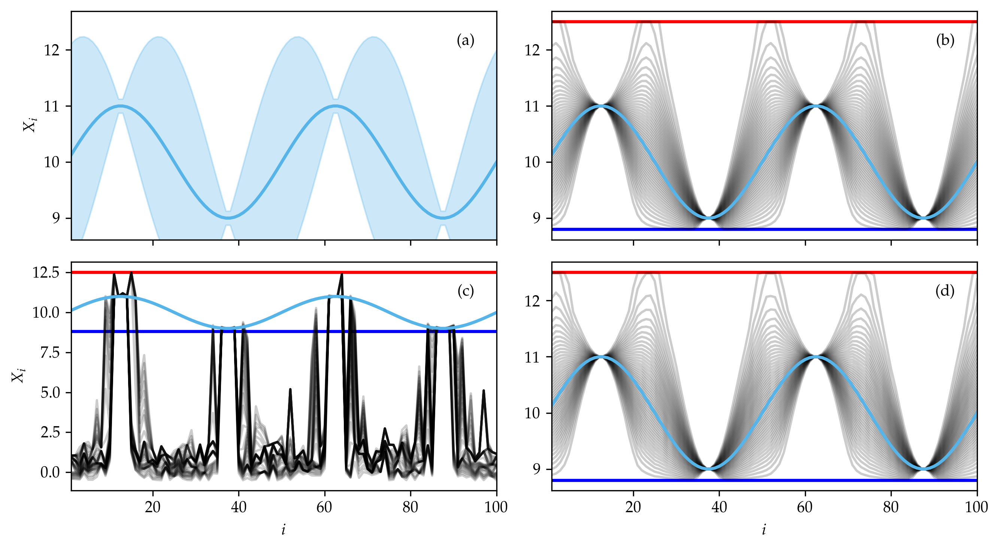

In [44]:
fig = plt.gcf()
fig[:set_size_inches](9.0,5.0)

plt.subplot(2,2,4)
read_samples(stan_smoothmax; output_format=:mcmcchains) |> plot_stan
_ylim = plt.ylim()
plt.title("")
title_in_axis("(d)")
plt.ylabel("")

plt.subplot(2,2,1)
plot_prior()
plt.ylim(_ylim)
plt.title("")
title_in_axis("(a)")
plt.xlabel("")
plt.gca()[:set_xticklabels]([])

plt.subplot(2,2,2)
plot_analy()
plt.title("")
title_in_axis("(b)")
plt.xlabel("")
plt.ylabel("")
plt.gca()[:set_xticklabels]([])

plt.subplot(2,2,3)
read_samples(stan_nosmooth; output_format=:mcmcchains) |> plot_stan
plt.title("")
title_in_axis("(c)")

cd(_pwd)
plt.gcf()[:tight_layout]()
plt.savefig("../figures/toy_quantiles.png", bbox_inches="tight")
plt.savefig("../figures/toy_quantiles.pdf", bbox_inches="tight")
;